##Installing YOLOv5 environment

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
!pip install -U -r yolov5/requirements.txt  # install dependencies
%cd /content/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 14807, done.
remote: Counting objects: 100% (377/377), done.
remote: Compressing objects: 100% (164/164), done.
remote: Total 14807 (delta 261), reused 317 (delta 213), pack-reused 14430
Receiving objects: 100% (14807/14807), 13.55 MiB | 16.52 MiB/s, done.
Resolving deltas: 100% (10243/10243), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 11.2 MB 14.6 MB/s 
     |████████████████████████████████| 3.2 MB 45.5 MB/s 
     |████████████████████████████████| 62 kB 1.6 MB/s 
     |██████████████████████████████  | 834.1 MB 1.2 MB/s eta 0:00:49tcmalloc: large alloc 1147494400 bytes == 0x395c6000 @  0x7f3b0d075615 0x58ead6 0x4f355e 0x4d222f 0x51041f 0x5b4ee6 0x58ff2e 0x510325 0x5b4ee6 0x58ff2e 0x50d482 0x4d00fb 0x50cb8d 0x4d00fb 0x50cb8d 0x4d00fb 0x50cb8d 0x4bac0a 0x538a76 0x590ae5 0x510280 0x5b4ee6 0x58ff2e 0x50d482 0x5b4ee6 0x58ff2e 0x50c4fc

/content/yolov5


In [ ]:
import torch
from IPython.display import Image
# device=torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

##Downloading data

In [ ]:
!pip install -q roboflow

     |████████████████████████████████| 41 kB 218 kB/s 
     |████████████████████████████████| 178 kB 27.6 MB/s 
     |████████████████████████████████| 138 kB 67.5 MB/s 
     |████████████████████████████████| 67 kB 6.5 MB/s 
     |████████████████████████████████| 145 kB 68.1 MB/s 
     |████████████████████████████████| 54 kB 3.4 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires ipython~=7.9.0, but you have ipython 7.34.0 which is incompatible.


In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="8IJbBd0LBWDN9Ypf9Npl")
project = rf.workspace("tejas").project("object-detection1-oogw4")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Object-Detection1-1 in yolov5pytorch:: 100%|██████████| 752/752 [00:00<00:00, 1460.35it/s]


In [ ]:
%cd /content/
!curl -L "https://app.roboflow.com/ds/oMu96NhPxJ?key=DMBmj4LQZf" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   893  100   893    0     0    473      0  0:00:01  0:00:01 --:--:--   473
100 19.7M  100 19.7M    0     0  6249k      0  0:00:03  0:00:03 --:--:-- 17.1M
Archive:  roboflow.zip
replace README.dataset.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: Y
 extracting: README.dataset.txt      
replace README.roboflow.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: Y
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/images/
 extracting: test/images/1110_jpeg.rf.2d86e0b44514212f97d4d6c2677b13f6.jpg  
 extracting: test/images/Broken-glass-of-car-window-image_21_jpeg.rf.bce677427807a46ab9181e925a4096c1.jpg  
 extracting: test/images/Broken-headlights-of-car_11_jpeg.rf.5a0a555a4c329d16b574f1de285dc7eb.jpg  
 extracting: test/images/Broken-headlights-of-car_29_jpeg.rf.e3046432bbdcd7d9b85a58ec1f2df

##Editing the YAML file

In [ ]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: 4 # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 200 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
train: weights=, cfg=./models/custom_yolov5s.yaml, data=/content/yolov5/Object-Detection1-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=200, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-220-g49156eb Python-3.7.15 torch-1.13.0+cu117 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

GROUND TRUTH TRAINING DATA:


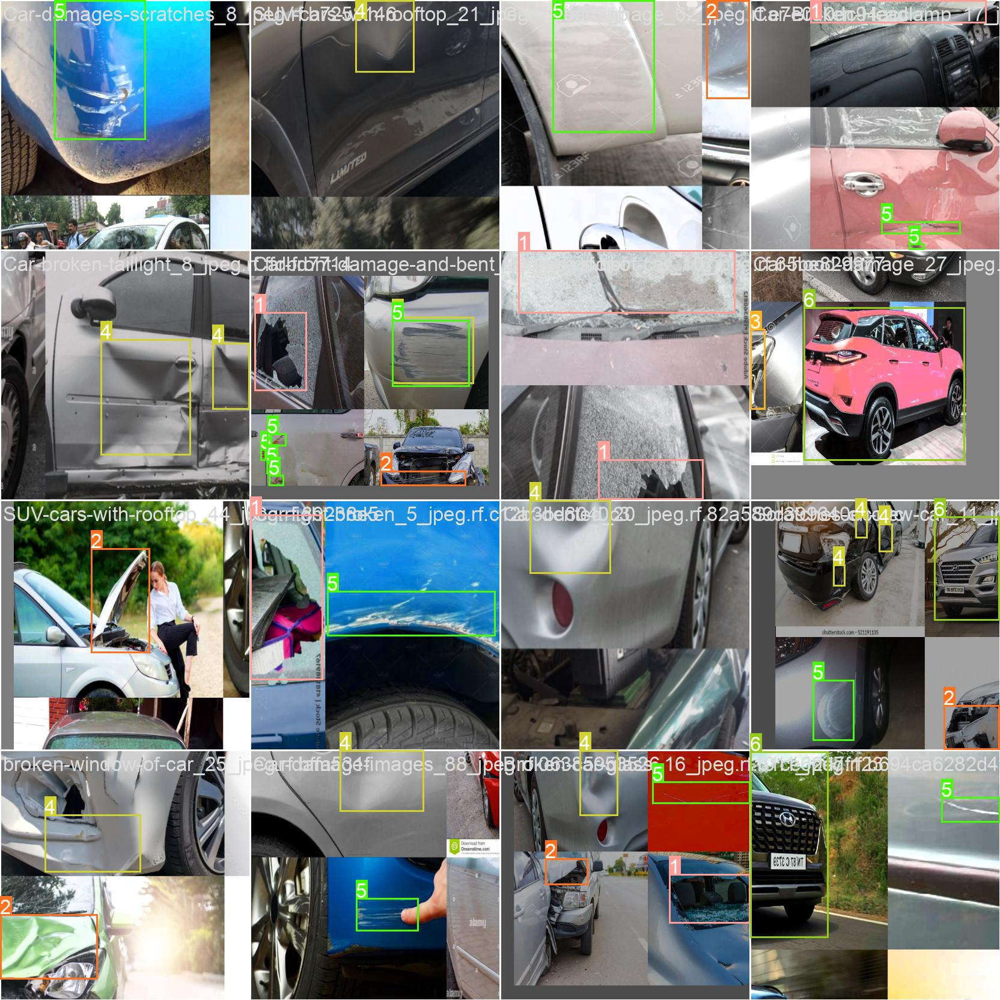

In [ ]:
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=1000)

In [ ]:
%ls runs/

train/


In [ ]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source ../test/images

/content/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=../test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-217-ga625f29 Python-3.7.15 torch-1.13.0+cu117 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7262700 parameters, 0 gradients
image 1/35 /content/test/images/Broken-car-glass_24_jpeg.rf.5a5e8054fd200a440c2682c84385c5f2.jpg: 416x416 (no detections), 10.9ms
image 2/35 /content/test/images/Car-Broken-Headlamp_26_jpeg.rf.42174946239fa2d7194f7c47ef92be0d.jpg: 416x416 1 Broken-light, 11.4ms
image 3/35 /content/test/images/Car-Broken-Headlamp_32_jpeg.rf.59d

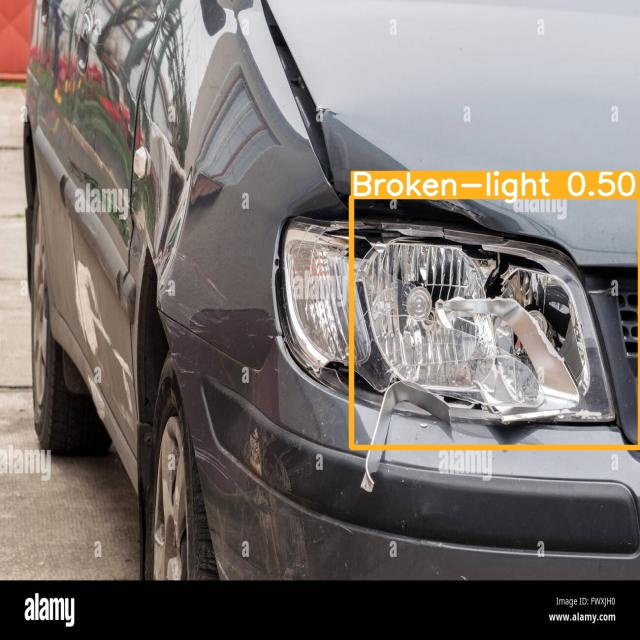

In [ ]:
Image(filename='/content/yolov5/runs/detect/exp/Car-Broken-Headlamp_26_jpeg.rf.42174946239fa2d7194f7c47ef92be0d.jpg', width=500)

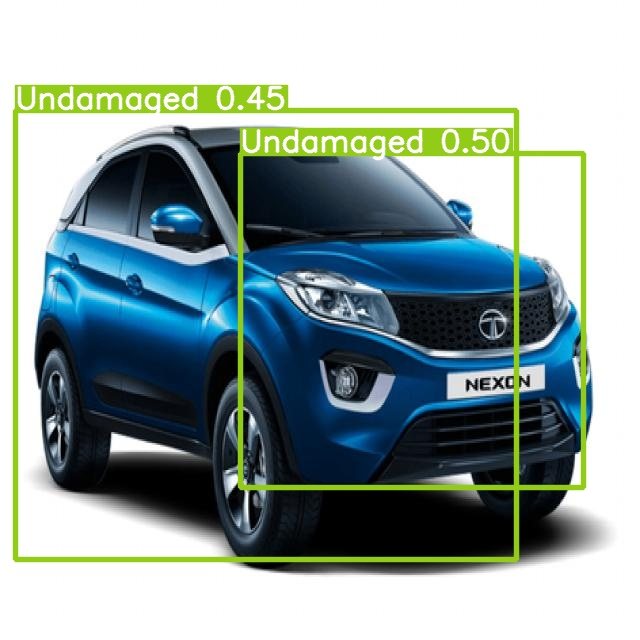

In [ ]:
Image(filename='/content/yolov5/runs/detect/exp/tata-suv-cars_4_png.rf.6a0e4be1f7362a4b4b226d68549c681f.jpg',width=500)